## Install the required packages 



```
%conda install -c conda-forge pdf2image tesseract
%pip install pyocr
```


Details about pdf2image

https://github.com/Belval/pdf2image

Datils about pyocr
https://gitlab.gnome.org/World/OpenPaperwork/pyocr



In [1]:
from pdf2image import convert_from_path


In [2]:
flyer = convert_from_path('data/NAWSA.pdf')

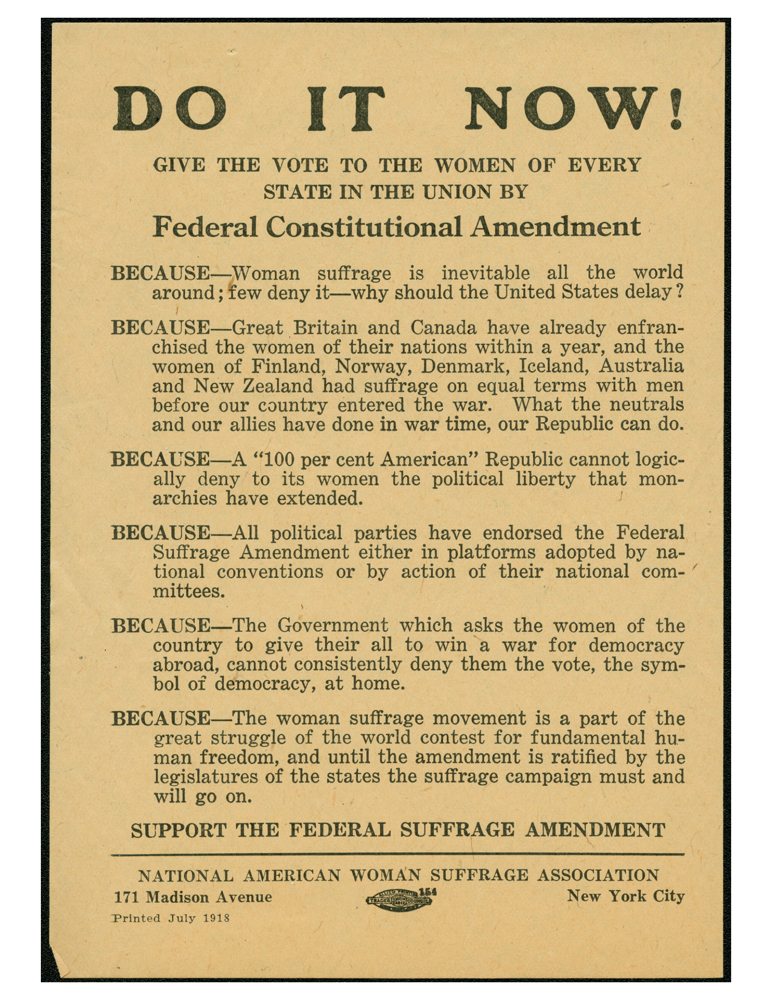

In [3]:
flyer[0]

In [4]:
from pyocr.tesseract import image_to_string

In [5]:
text = image_to_string(flyer[0])

In [6]:
print(text)

DO IT NOW!

GIVE THE VOTE TO THE WOMEN OF EVERY
STATE IN THE UNION BY

Federal Constitutional Amendment

BECAUSE—Woman suffrage is inevitable all the world
around; few deny it—why should the United States delay?

BECAUSE—Great Britain and Canada have already enfran-
chised the women of their nations within a year, and the
women of Finland, Norway, Denmark, Iceland, Australia
and New Zealand had suffrage on equal terms with men
before our country entered the war. What the neutrals
and our allies have done in war time, our Republic can do.

BECAUSE—A “100 per cent American’ Republic cannot logic-
ally deny to oe women the political Pabeity that mon-
archies have extended.

BECAUSE—AII political parties have endorsed the Federal
Suffrage Amendment either in platforms adopted by na-
tional conventions or by action of their national com-
mittees.

BECAUSE—The edebennient which asks the women of the

country to give their all to win a war for democracy
abroad, cannot consistently deny them t

In [7]:
journal_pages = convert_from_path('data/Progressive_Woman_Vol-4_Iss-42.pdf') 

In [8]:
len(journal_pages)

16

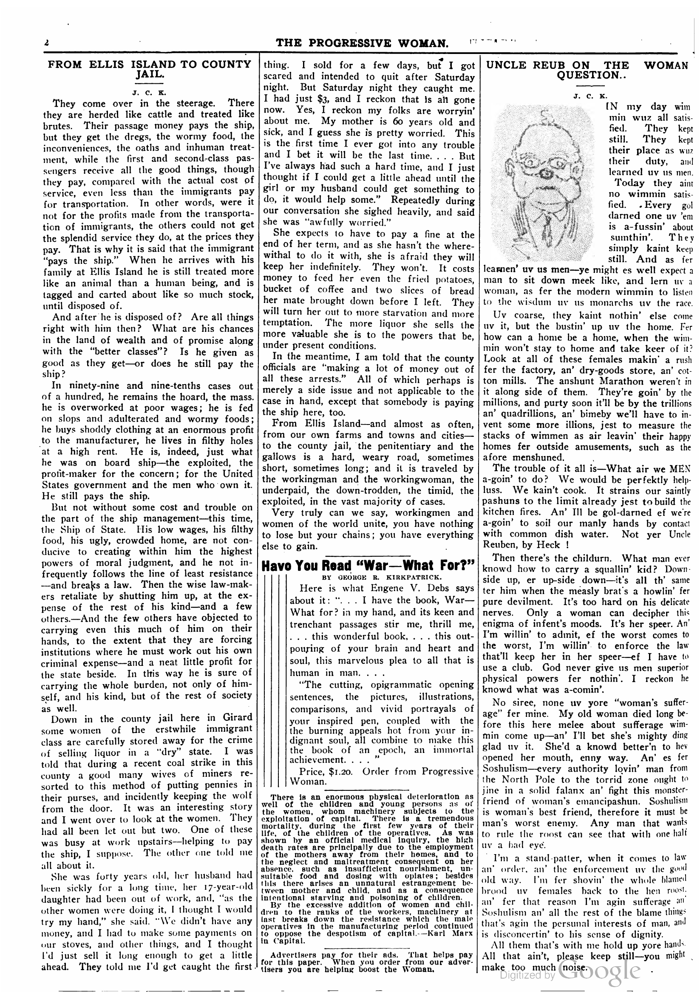

In [9]:
journal_pages[1]

In [10]:
print(image_to_string(journal_pages[1]))

2

 

FROM ELLIS ISLAND TO COUNTY
JAIL.

 

Joc K.

They come over in the steerage. There
they are herded like cattle and treated like
brutes. Their passage money pays the ship,
but they get the dregs, the wormy food, the
inconveniences, the oaths and inhuman treat-
ment, while the first and second-class pas-
sengers receive all the good things, though
they pay, compared with the actual cost of
service, even less than the immigrants pay
for transportation. In other words, were it
not for the profits made from the transporta-
tion of immigrants, the others could not get
the splendid service they do, at the prices they
pay. That is why it is said that the immigrant
“pays the ship.” When he arrives with his
family at Ellis Island he is still treated more
like an animal than a human being, and is
tagged and carted about like so much stock,
until disposed of.

And after he is disposed of? Are all things
right with him then? What are his chances
in the land of wealth and of promise along
wit

![](images/rough_graph.png)

In [12]:
file_name = 'data/Progressive_Woman_Vol-4_Iss-42.pdf'

pages = convert_from_path(file_name)
pages = pages[:3]


contents = []
for n, page in enumerate(pages):
    meta = {'text'        : image_to_string(page),
           'page_number'  : n + 1,
           'image'        : page,
           'fn'           : file_name}
    
    contents.append(meta)

In [13]:
import pandas as pd
df = pd.DataFrame(contents)

In [14]:
df.head()

,text,page_number,image,fn
0,we\n\nStanford Liksssy «\nFOR THE WOMAN WHO WO...,1,<PIL.PpmImagePlugin.PpmImageFile image mode=RG...,data/Progressive_Woman_Vol-4_Iss-42.pdf
1,2\n\n \n\nFROM ELLIS ISLAND TO COUNTY\nJAIL.\n...,2,<PIL.PpmImagePlugin.PpmImageFile image mode=RG...,data/Progressive_Woman_Vol-4_Iss-42.pdf
2,et\n\nTHE PROGRESSIVE WOMAN.\n\n \n\nTHE SWEAT...,3,<PIL.PpmImagePlugin.PpmImageFile image mode=RG...,data/Progressive_Woman_Vol-4_Iss-42.pdf


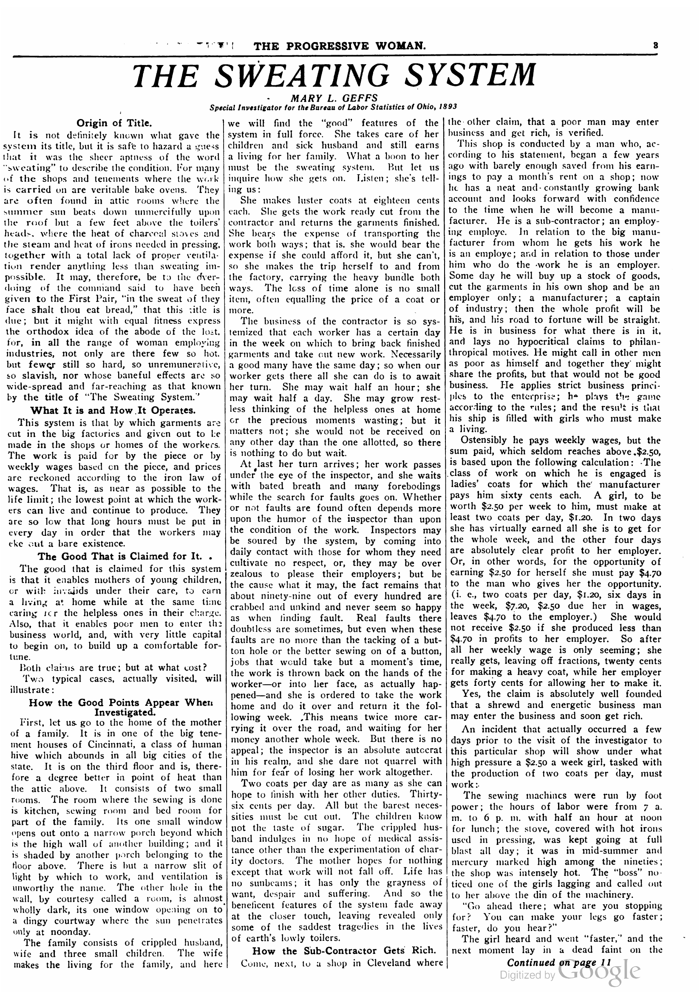

In [15]:
df['image'][2]

In [16]:
df.to_json('data/pw.json')

In [17]:
df2 = pd.read_json('data/pw.json')

In [18]:
df2

,text,page_number,image,fn
0,we\n\nStanford Liksssy «\nFOR THE WOMAN WHO WO...,1,"{'category': 0, 'custom_mimetype': 'image/x-po...",data/Progressive_Woman_Vol-4_Iss-42.pdf
1,2\n\n \n\nFROM ELLIS ISLAND TO COUNTY\nJAIL.\n...,2,"{'category': 0, 'custom_mimetype': 'image/x-po...",data/Progressive_Woman_Vol-4_Iss-42.pdf
2,et\n\nTHE PROGRESSIVE WOMAN.\n\n \n\nTHE SWEAT...,3,"{'category': 0, 'custom_mimetype': 'image/x-po...",data/Progressive_Woman_Vol-4_Iss-42.pdf


In [19]:
df.to_pickle('data/pw.pickle')

In [20]:
df2 = pd.read_pickle('data/pw.pickle')

In [21]:
df2.head()

,text,page_number,image,fn
0,we\n\nStanford Liksssy «\nFOR THE WOMAN WHO WO...,1,<PIL.PpmImagePlugin.PpmImageFile image mode=RG...,data/Progressive_Woman_Vol-4_Iss-42.pdf
1,2\n\n \n\nFROM ELLIS ISLAND TO COUNTY\nJAIL.\n...,2,<PIL.PpmImagePlugin.PpmImageFile image mode=RG...,data/Progressive_Woman_Vol-4_Iss-42.pdf
2,et\n\nTHE PROGRESSIVE WOMAN.\n\n \n\nTHE SWEAT...,3,<PIL.PpmImagePlugin.PpmImageFile image mode=RG...,data/Progressive_Woman_Vol-4_Iss-42.pdf


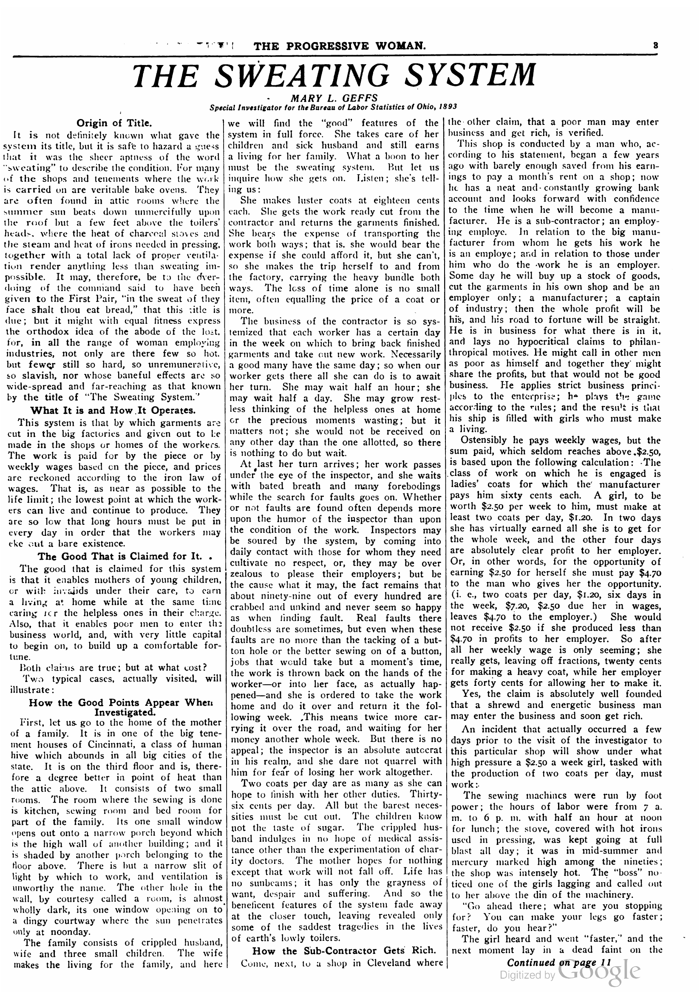

In [22]:
df2['image'][2]

In [23]:
from pdf2image import convert_from_path
from pyocr.tesseract import image_to_string
import pandas as pd


def pdf_ocr_df(file_name):
    """
    OCR PDF returning a dataframe.
    """

    pages = convert_from_path(file_name)

    contents = []
    for n, page in enumerate(pages):
        meta = {
            "text": image_to_string(page),
            "page_number": n + 1,
            "image": page,
            "fn": file_name,
        }

        contents.append(meta)
    return pd.DataFrame(contents)

In [24]:
df = pdf_ocr_df('data/Mother-Earth_Vol-6_Iss-2.pdf')

In [25]:
df.head()

,text,page_number,image,fn
0,"Vol. VI. APRIL, 1911\n\n \n \n \n\nCONTENTS...",1,<PIL.PpmImagePlugin.PpmImageFile image mode=RG...,data/Mother-Earth_Vol-6_Iss-2.pdf
1,Anarchism and Other Essay\n\n \n\nEMMA GOLDMAN...,2,<PIL.PpmImagePlugin.PpmImageFile image mode=RG...,data/Mother-Earth_Vol-6_Iss-2.pdf
2,60\n\nMorHer Carta\n\nMonthly Magazine Devoted...,3,<PIL.PpmImagePlugin.PpmImageFile image mode=RG...,data/Mother-Earth_Vol-6_Iss-2.pdf
3,34 EvERLASTING MurDER\n\nEVERLASTING MURDER\nB...,4,<PIL.PpmImagePlugin.PpmImageFile image mode=RG...,data/Mother-Earth_Vol-6_Iss-2.pdf
4,MortHer Eartu 35\n\nful if it wishes to enjoy ...,5,<PIL.PpmImagePlugin.PpmImageFile image mode=RG...,data/Mother-Earth_Vol-6_Iss-2.pdf


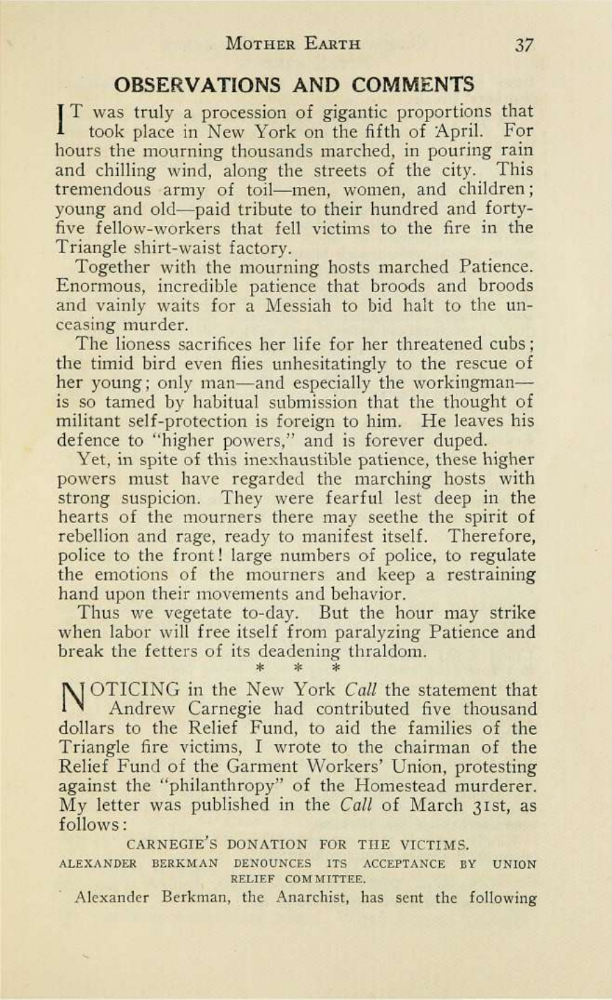

In [26]:
df['image'][6]

In [27]:
print(df['text'][6])

Mornuer EartH 37,

OBSERVATIONS AND COMMENTS

i was truly a procession of gigantic proportions that

took place in New York on the fifth of April. For
hours the mourning thousands marched, in pouring rain
and chilling wind, along the streets of the city. This
tremendous army of toil—men, women, and children;
young and old—paid tribute to their hundred and forty-
five fellow-workers that fell victims to the fire in the
Triangle shirt-waist factory.

Together with the mourning hosts marched Patience.
Enormous, incredible patience that broods and broods
and vainly waits for a Messiah to bid halt to the un-
ceasing murder.

The lioness sacrifices her life for her threatened cubs;
the timid bird even flies unhesitatingly to the rescue of
her young; only man—and especially the workingman—
is so tamed by habitual submission that the thought of
militant self-protection is foreign to him. He leaves his
defence to “higher powers,” and is forever duped.

Yet, in spite of this inexhaustible patien